**Inversion of Image using ResNet50 model**

# Main
Dataset downloading and training

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=a660f94ff641cf29c597033d636b0cc9a41cae792e48b59337e8d56377ee1101
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [ ]:
import numpy as np
import pandas as pd
from __future__ import print_function
import os
import sys
import wget
import zipfile

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from keras.applications.resnet50 import ResNet50
from keras.applications.imagenet_utils import preprocess_input
from keras.models import Model
from keras.layers import Dense, Flatten
from keras.optimizers import SGD

Downloading dataset

In [ ]:
def download(output_dir):
    for i in range(7):
        filename = 'part{}.zip'.format(i + 1)
        url = r'http://www.cs.ucf.edu/~aroshan/index_files/Dataset_PitOrlManh/zipped images/' + filename
        print('Downloading', url)
        filepath = wget.download(url, out=os.path.join(output_dir))

        print('\nExtracting', filename)
        with zipfile.ZipFile(filepath, 'r') as z:
            z.extractall(output_dir)
        os.remove(filepath)


def get_filenames(path):
    if not os.path.exists(path):
        os.makedirs(path)
        download(path)
    elif len(os.listdir(path)) == 0:
        download(path)

    image_paths = []
    for filename in os.listdir(path):
        view_id = filename.split('_')[1].split('.')[0]
        # ignore images with markers (0) and upward views (5)
        if not(view_id == '0' or view_id == '5'):
            image_paths.append(os.path.join(path, filename))

    # 90% train images and 10% test images
    n_train_samples = int(len(image_paths) * 0.9)
    train_filenames = image_paths[:n_train_samples]
    test_filenames = image_paths[n_train_samples:]

    return train_filenames, test_filenames

In [ ]:
%cd '/content/gdrive/My Drive/Inversion'

/content/gdrive/My Drive/Inversion


In [ ]:
from utils import angle_error, DataGenerator

In [ ]:
%cd '/content'

/content


In [ ]:
data_path = os.path.join('data', 'street_view')
train_filenames, test_filenames = get_filenames(data_path)
print(len(train_filenames), 'train samples')
print(len(test_filenames), 'test samples')


Extracting part1.zip

Extracting part2.zip

Extracting part3.zip

Extracting part4.zip

Extracting part5.zip

Extracting part6.zip

Extracting part7.zip
27716 train samples
3080 test samples


In [ ]:
from PIL import Image
for i in range(len(train_filenames)):
  image = Image.open(train_filenames[i])
  image.save(train_filenames[i],quality=20,optimize=True)

Training

In [ ]:
from keras.models import load_model
# number of classes
nb_classes = 360
# input image shape
input_shape = (224, 224, 3)
model_name = 'rotnet_street_view_resnet50'


# load base model
base_model = ResNet50(weights='imagenet', include_top=False,
                      input_shape=input_shape)

# append classification layer
x = base_model.output
x = Flatten()(x)
final_output = Dense(nb_classes, activation='softmax')(x)

# create the new model
model = Model(inputs=base_model.input, outputs=final_output)

model.summary()

# model compilation
model.compile(loss='categorical_crossentropy',
              optimizer=SGD(lr=0.01, momentum=0.9),
              metrics=[angle_error])

# training parameters
batch_size = 64
nb_epoch = 50

output_folder = 'models'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# callbacks
monitor = 'val_angle_error'
checkpointer = ModelCheckpoint(
    filepath=os.path.join(output_folder, model_name + '.hdf5'),
    monitor=monitor,
    save_best_only=True
)
reduce_lr = ReduceLROnPlateau(monitor=monitor, patience=3)
early_stopping = EarlyStopping(monitor=monitor, patience=5)
tensorboard = TensorBoard()
'''
model = load_model('/content/gdrive/My Drive/rotnet_street_view_resnet50 (1).hdf5', custom_objects={"angle_error": angle_error})
'''
# training loop
model.fit_generator(
        DataGenerator(
        train_filenames,
        input_shape=input_shape,
        batch_size=batch_size,
        preprocess_func=preprocess_input,
        crop_center=True,
        crop_largest_rect=True,
        shuffle=True
    ),
    steps_per_epoch=len(train_filenames) / batch_size,
    epochs=nb_epoch,
    validation_data= DataGenerator(
        test_filenames,
        input_shape=input_shape,
        batch_size=batch_size,
        preprocess_func=preprocess_input,
        crop_center=True,
        crop_largest_rect=True
    ),
    validation_steps=len(test_filenames) / batch_size,
    callbacks=[checkpointer, reduce_lr, early_stopping, tensorboard],
    workers=10
)

In [ ]:
from google.colab import files
files.download('/content/models/rotnet_street_view_resnet50.hdf5') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Test 
Testing of sample images

Download weights from - 
https://drive.google.com/file/d/1VHFCxutBsDjgxfLClGw9AyW0qLrgpO9k/view?usp=sharing

In [ ]:
model = load_model('/content/gdrive/My Drive/rotnet_street_view_resnet50 (1).hdf5', custom_objects={"angle_error": angle_error})

In [ ]:
from __future__ import print_function

import os
import cv2
import numpy as np
import argparse

from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
from PIL import Image  

from utils import DataGenerator, crop_largest_rectangle, angle_error, rotate

In [ ]:
def process_images(model, input_path, output_path,
                   batch_size=64, crop=True):
    extensions = ['.jpg', '.jpeg', '.bmp', '.png']

    output_is_image = False
    if os.path.isfile(input_path):
        image_paths = [input_path]
        if os.path.splitext(output_path)[1].lower() in extensions:
            output_is_image = True
            output_filename = output_path
            output_path = os.path.dirname(output_filename)
    else:
        image_paths = [os.path.join(input_path, f)
                       for f in os.listdir(input_path)
                       if os.path.splitext(f)[1].lower() in extensions]
        if os.path.splitext(output_path)[1].lower() in extensions:
            print('Output must be a directory!')

    predictions = model.predict_generator(
            DataGenerator(
            image_paths,
            input_shape=(224, 224, 3),
            batch_size=64,
            one_hot=True,
            preprocess_func=preprocess_input,
            rotate=False,
            crop_largest_rect=True,
            crop_center=True
        ),
        
    )

    predicted_angles = np.argmax(predictions, axis=1)
    print("predicted angle of rotation is : " , predicted_angles)

    if output_path == '':
        output_path = '.'

    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for path, predicted_angle in zip(image_paths, predicted_angles):
        image = Image.open(path)
        image.show()
        image = cv2.imread(path)
        rotated_image = rotate(image, -predicted_angle)
        if crop:
            size = (image.shape[0], image.shape[1])
            rotated_image = crop_largest_rectangle(rotated_image, -predicted_angle, *size)
        if not output_is_image:
            output_filename = os.path.join(output_path, os.path.basename(path))
        cv2.imwrite(output_filename, rotated_image)
        return predicted_angles

In [ ]:
pred = process_images(model,'/content/gdrive/MyDrive/Inversion/', '/content' )

predicted angle of rotation is :  [173 190 172 190 196]


Input Images

Input Images:


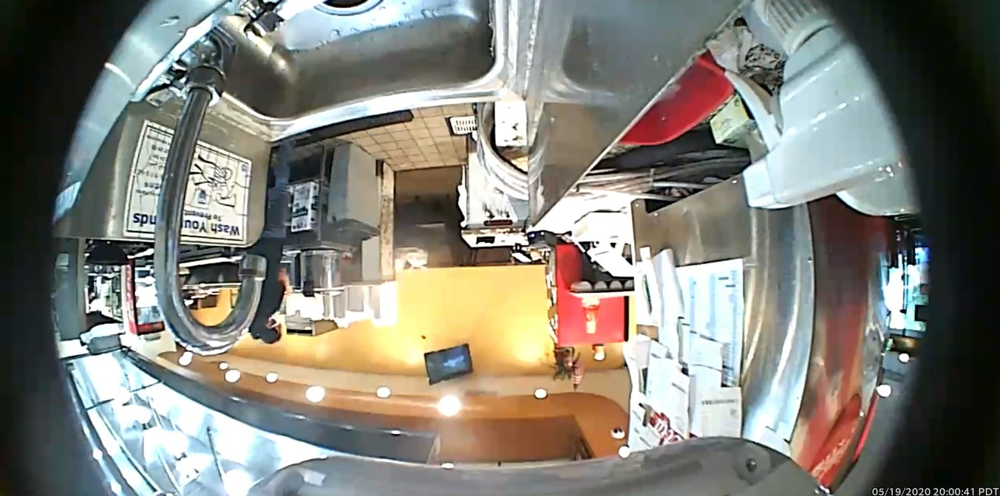

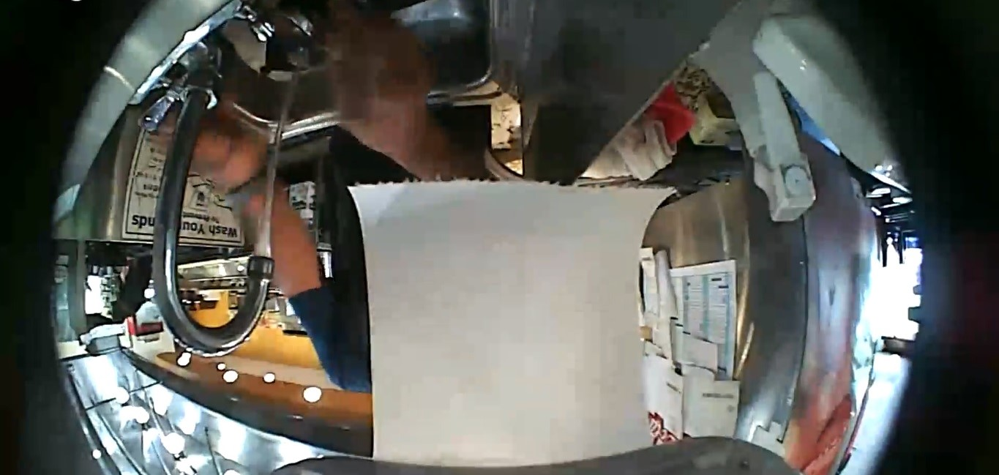

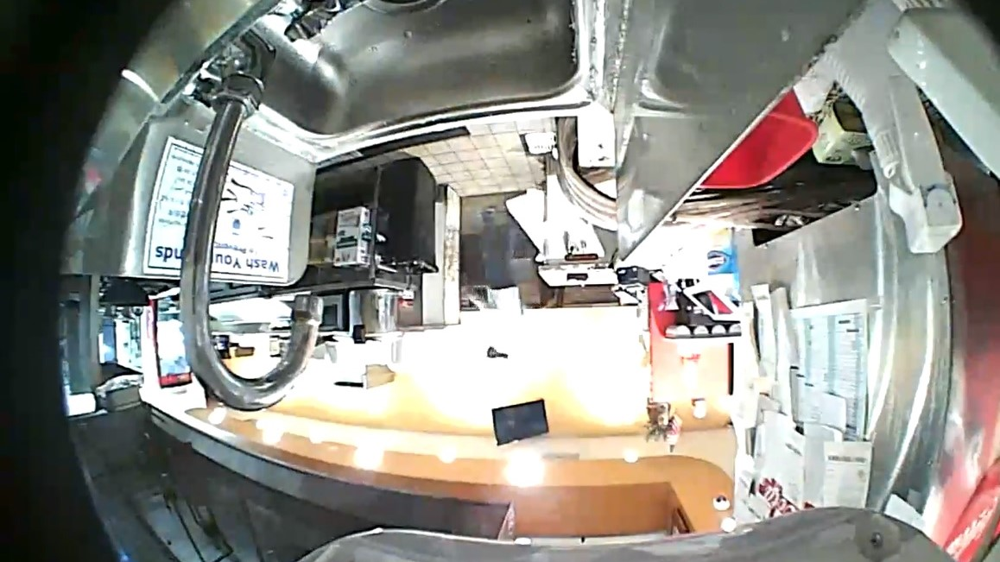

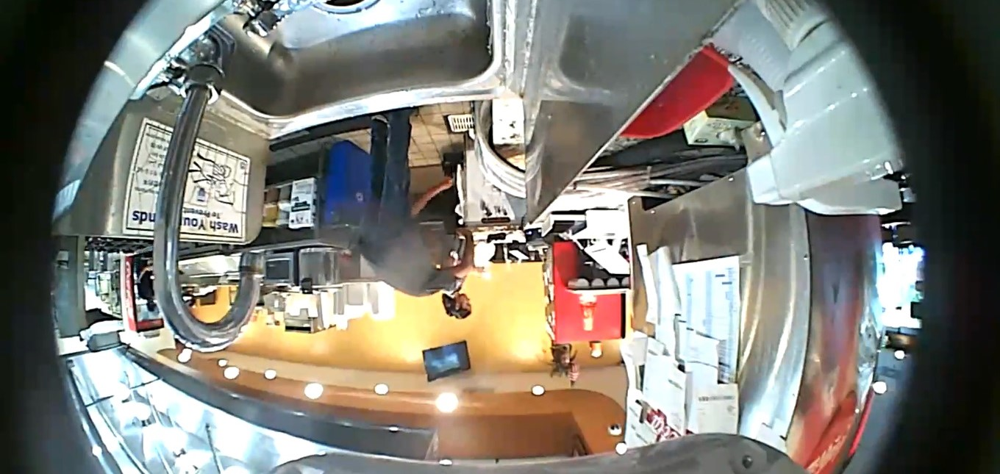

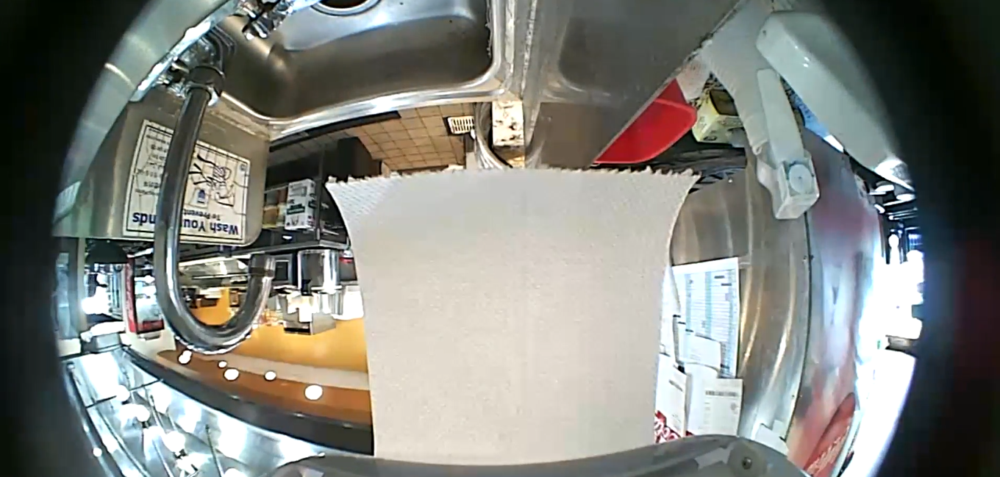

In [ ]:
import cv2
from pathlib import Path
from google.colab.patches import cv2_imshow
path=Path(".")

path=path.glob("*.jpg")

print('Input Images:')


for imagepath in glob.glob("/content/gdrive/MyDrive/Inversion/*.jpg"):

        img=cv2.imread(str(imagepath))                     
        cv2_imshow(img)
        images.append(img)

Output Images

Output Images with predicted angles: [173 190 172 190 196]


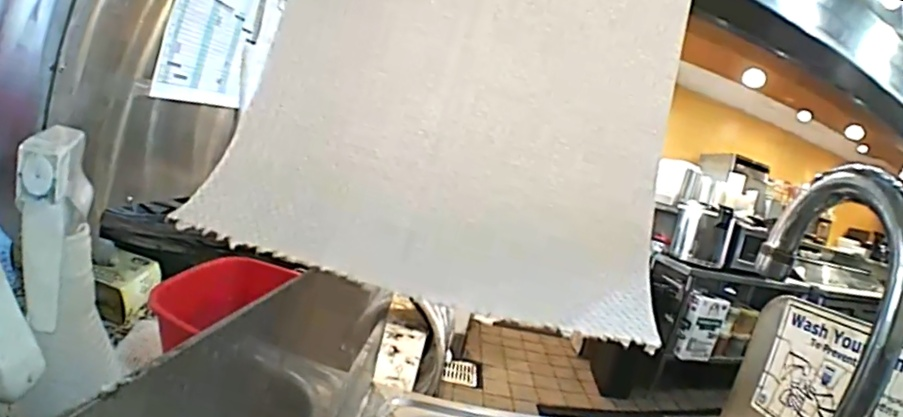

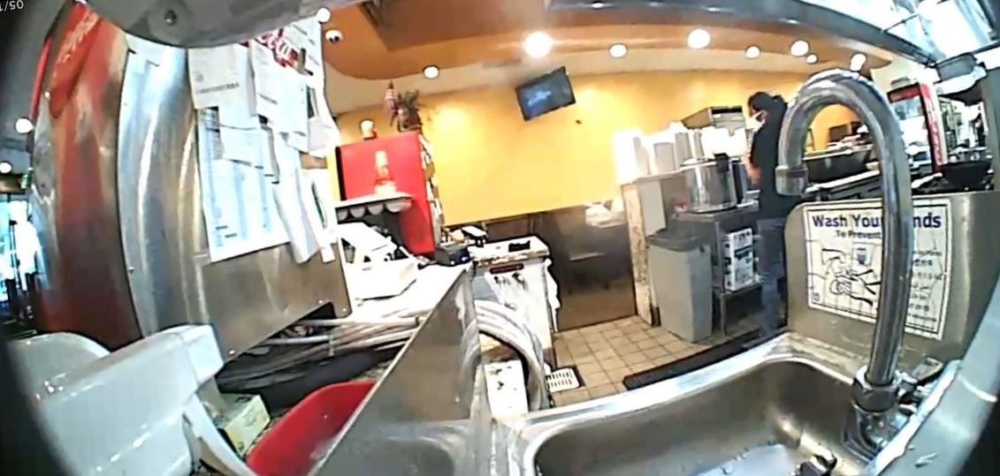

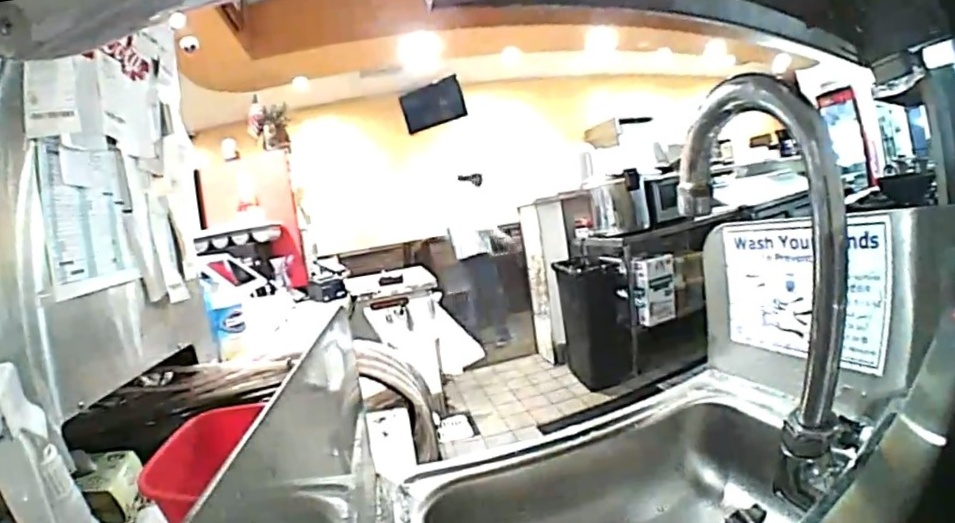

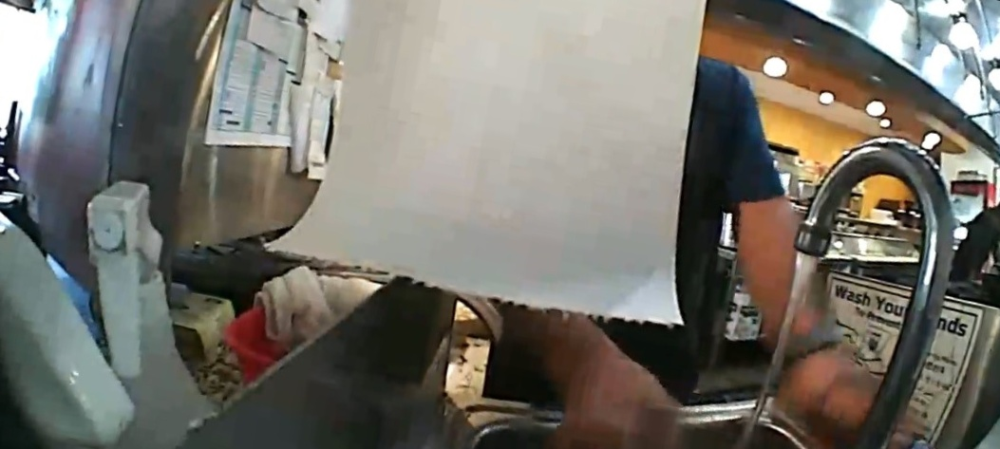

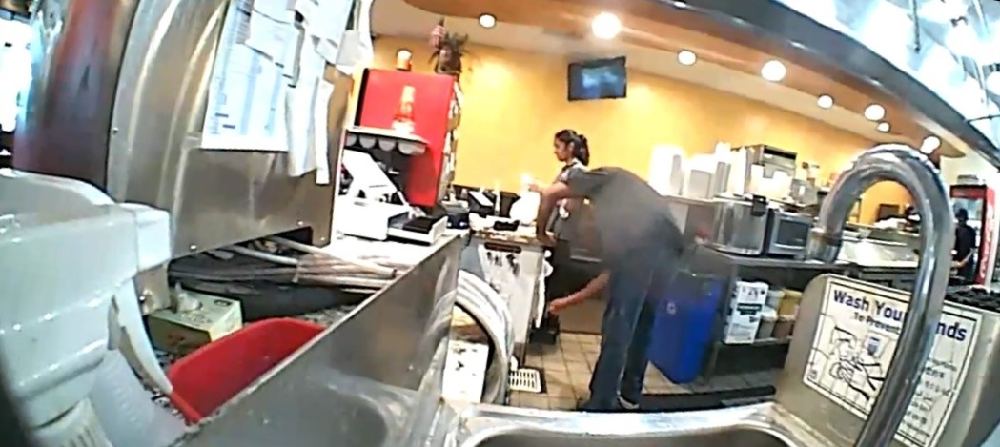

In [ ]:
import cv2
from pathlib import Path
from google.colab.patches import cv2_imshow
path=Path(".")

path=path.glob("*.jpg")

print('Output Images with predicted angles:', pred)


for imagepath in glob.glob("/content/*.jpg"):

        img=cv2.imread(str(imagepath))                     
        cv2_imshow(img)
        images.append(img)